In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px

# import warnings
# warnings.filterwarnings('ignore')

In [3]:
credits=pd.read_excel('6_default-of-credit-card-clients.xls',header=1)
credits.head(10)

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
5,6,50000,1,1,2,37,0,0,0,0,...,19394,19619,20024,2500,1815,657,1000,1000,800,0
6,7,500000,1,1,2,29,0,0,0,0,...,542653,483003,473944,55000,40000,38000,20239,13750,13770,0
7,8,100000,2,2,2,23,0,-1,-1,0,...,221,-159,567,380,601,0,581,1687,1542,0
8,9,140000,2,3,1,28,0,0,2,0,...,12211,11793,3719,3329,0,432,1000,1000,1000,0
9,10,20000,1,3,2,35,-2,-2,-2,-2,...,0,13007,13912,0,0,0,13007,1122,0,0


In [4]:
credits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   ID                          30000 non-null  int64
 1   LIMIT_BAL                   30000 non-null  int64
 2   SEX                         30000 non-null  int64
 3   EDUCATION                   30000 non-null  int64
 4   MARRIAGE                    30000 non-null  int64
 5   AGE                         30000 non-null  int64
 6   PAY_0                       30000 non-null  int64
 7   PAY_2                       30000 non-null  int64
 8   PAY_3                       30000 non-null  int64
 9   PAY_4                       30000 non-null  int64
 10  PAY_5                       30000 non-null  int64
 11  PAY_6                       30000 non-null  int64
 12  BILL_AMT1                   30000 non-null  int64
 13  BILL_AMT2                   30000 non-null  int64
 14  BILL_A

Ta thấy dữ liệu đã ở dạng Numerical Data nên không cần trans encoder nữa

In [5]:
credits.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


# Missing values

In [6]:
missing_values = credits.isnull().sum().sort_values(ascending = False)
percentage = (missing_values/len(credits))*100
missing_values = pd.concat([missing_values, percentage], axis = 1, keys= ['Missing values of credits dataset', 'Percentage Missing Values'])
missing_values

,Missing values of credits dataset,Percentage Missing Values
ID,0,0.0
BILL_AMT2,0,0.0
PAY_AMT6,0,0.0
PAY_AMT5,0,0.0
PAY_AMT4,0,0.0
PAY_AMT3,0,0.0
PAY_AMT2,0,0.0
PAY_AMT1,0,0.0
BILL_AMT6,0,0.0
BILL_AMT5,0,0.0


In [7]:
credits.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [8]:
credits.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


# Cleaning data

In [9]:
# Remove duplicate values
credits.drop_duplicates(subset = credits.columns.values[:-1], keep = 'first', inplace = True)
credits

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000,1,3,1,39,0,0,0,0,...,88004,31237,15980,8500,20000,5003,3047,5000,1000,0
29996,29997,150000,1,3,2,43,-1,-1,-1,-1,...,8979,5190,0,1837,3526,8998,129,0,0,0
29997,29998,30000,1,2,2,37,4,3,2,-1,...,20878,20582,19357,0,0,22000,4200,2000,3100,1
29998,29999,80000,1,3,1,41,1,-1,0,0,...,52774,11855,48944,85900,3409,1178,1926,52964,1804,1


In [10]:
# Remove ID column
credits.drop(columns=['ID'], inplace=True) 
# Rename target column 'default payment status'
credits.rename(columns={'default payment next month': 'DEFAULT'}, inplace=True) 
credits.rename(columns={'PAY_0': 'PAY_1'}, inplace=True) 
credits.head(10)


,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,DEFAULT
0,20000,2,2,1,24,2,2,-1,-1,-2,...,0,0,0,0,689,0,0,0,0,1
1,120000,2,2,2,26,-1,2,0,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,90000,2,2,2,34,0,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,50000,2,2,1,37,0,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,50000,1,2,1,57,-1,0,-1,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
5,50000,1,1,2,37,0,0,0,0,0,...,19394,19619,20024,2500,1815,657,1000,1000,800,0
6,500000,1,1,2,29,0,0,0,0,0,...,542653,483003,473944,55000,40000,38000,20239,13750,13770,0
7,100000,2,2,2,23,0,-1,-1,0,0,...,221,-159,567,380,601,0,581,1687,1542,0
8,140000,2,3,1,28,0,0,2,0,0,...,12211,11793,3719,3329,0,432,1000,1000,1000,0
9,20000,1,3,2,35,-2,-2,-2,-2,-1,...,0,13007,13912,0,0,0,13007,1122,0,0


In [11]:
# Change sex code to 'F' and 'M' and use category as datatype
credits["SEX"]=credits["SEX"].map({1:'M',2:'F'}).astype('category')
credits["SEX"].dtypes

CategoricalDtype(categories=['F', 'M'], ordered=False)

In [12]:
credits.dropna()
credits

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,DEFAULT
0,20000,F,2,1,24,2,2,-1,-1,-2,...,0,0,0,0,689,0,0,0,0,1
1,120000,F,2,2,26,-1,2,0,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,90000,F,2,2,34,0,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,50000,F,2,1,37,0,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,50000,M,2,1,57,-1,0,-1,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,220000,M,3,1,39,0,0,0,0,0,...,88004,31237,15980,8500,20000,5003,3047,5000,1000,0
29996,150000,M,3,2,43,-1,-1,-1,-1,0,...,8979,5190,0,1837,3526,8998,129,0,0,0
29997,30000,M,2,2,37,4,3,2,-1,0,...,20878,20582,19357,0,0,22000,4200,2000,3100,1
29998,80000,M,3,1,41,1,-1,0,0,0,...,52774,11855,48944,85900,3409,1178,1926,52964,1804,1


In [13]:
fill = (credits.EDUCATION == 0) | (credits.EDUCATION == 5) | (credits.EDUCATION == 6)
credits.loc[fill, 'EDUCATION'] = 4
print('EDUCATION ' + str(sorted(credits['EDUCATION'].unique())))

EDUCATION [1, 2, 3, 4]


In [14]:
credits.describe()

,LIMIT_BAL,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,DEFAULT
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,167484.322667,1.842267,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,-0.266200,-0.291100,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,129747.661567,0.744494,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,1.133187,1.149988,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,10000.000000,1.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,50000.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,140000.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,240000.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,1000000.000000,4.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


In [15]:
credits.isna().count()

LIMIT_BAL    30000
SEX          30000
EDUCATION    30000
MARRIAGE     30000
AGE          30000
PAY_1        30000
PAY_2        30000
PAY_3        30000
PAY_4        30000
PAY_5        30000
PAY_6        30000
BILL_AMT1    30000
BILL_AMT2    30000
BILL_AMT3    30000
BILL_AMT4    30000
BILL_AMT5    30000
BILL_AMT6    30000
PAY_AMT1     30000
PAY_AMT2     30000
PAY_AMT3     30000
PAY_AMT4     30000
PAY_AMT5     30000
PAY_AMT6     30000
DEFAULT      30000
dtype: int64

Don't have to deal with null values

In [16]:
from pandas import DataFrame
credits=DataFrame(credits)
credits

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,DEFAULT
0,20000,F,2,1,24,2,2,-1,-1,-2,...,0,0,0,0,689,0,0,0,0,1
1,120000,F,2,2,26,-1,2,0,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,90000,F,2,2,34,0,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,50000,F,2,1,37,0,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,50000,M,2,1,57,-1,0,-1,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,220000,M,3,1,39,0,0,0,0,0,...,88004,31237,15980,8500,20000,5003,3047,5000,1000,0
29996,150000,M,3,2,43,-1,-1,-1,-1,0,...,8979,5190,0,1837,3526,8998,129,0,0,0
29997,30000,M,2,2,37,4,3,2,-1,0,...,20878,20582,19357,0,0,22000,4200,2000,3100,1
29998,80000,M,3,1,41,1,-1,0,0,0,...,52774,11855,48944,85900,3409,1178,1926,52964,1804,1


In [17]:
credits.shape


(30000, 24)

In [18]:
credits.dtypes.unique()

array([dtype('int64'),
       CategoricalDtype(categories=['F', 'M'], ordered=False)],
      dtype=object)

In [19]:
# Create a new column "HAS_DEF" to indicate customers who have at least 1 deafult payment from PAY_1 to Pay_6
# 0 : no default ; 1: has default
def_condition = (credits.PAY_1 >1) | (credits.PAY_2 >1) | (credits.PAY_3 >1) | (credits.PAY_4 >1) | (credits.PAY_5 >1) | (credits.PAY_6 >1)
credits.loc[def_condition, "HAS_DEF"] = 1
credits.loc[credits.HAS_DEF.isna(), "HAS_DEF"] = 0

# Explore SEX vs. Default


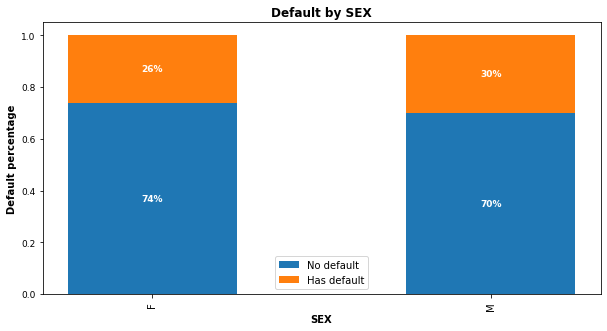

In [20]:
# Define a function to plot stacked bar chart since there will be multiple stacked bars charts to plot

def create_stacked_bar(column_name):

    # Get the percentage of default by each group
    default_by_group = pd.crosstab(index=credits['HAS_DEF'],columns = credits[column_name], normalize = 'columns')
    
    # Round up to 2 decimal
    default_by_group = default_by_group.apply(lambda x: round(x,2))
    
    labels = default_by_group.columns
    list1 = default_by_group.iloc[0].to_list()
    list2 = default_by_group.iloc[1].to_list()
    
    list1_name = "No default"
    list2_name = "Has default"
    title = f"Default by {column_name}"
    xlabel = column_name
    ylabel = "Default percentage"
    
    fig, ax = plt.subplots(figsize=(10, 5))
    bar_width = 0.5
    
    ax1 = ax.bar(labels,list1, bar_width, label = list1_name)
    ax2 = ax.bar(labels,list2, bar_width, bottom = list1, label = list2_name)

    ax.set_title(title, fontweight = "bold")
    ax.set_xlabel(xlabel, fontweight = "bold")
    ax.set_ylabel(ylabel, fontweight = "bold")
    ax.legend(loc="best")
    
    plt.xticks(list(range(len(labels))), labels,rotation=90)
    plt.yticks(fontsize=9)

    for r1, r2 in zip(ax1, ax2):
        h1 = r1.get_height()
        h2 = r2.get_height()
        plt.text(r1.get_x() + r1.get_width() / 2., h1 / 2., f"{h1:.0%}", ha="center", va="center", color="white", fontsize=9, fontweight="bold")
        plt.text(r2.get_x() + r2.get_width() / 2., h1 + h2 / 2., f"{h2:.0%}", ha="center", va="center", color="white", fontsize=9, fontweight="bold")

    plt.show()
    
# Plot a stacked bar chart to visualize default percentage by female and male

create_stacked_bar('SEX')

30% đàn ông có thanh toán default trong khi đó 26% phụ nữ thanh toán default. Sự chênh lệch không đáng kể

# Explore Education vs. Default


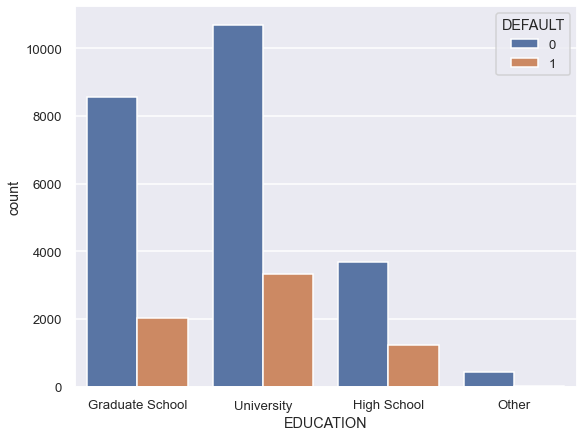

In [21]:
sns.set(rc={'figure.figsize':(9,7)})
sns.set_context("talk", font_scale=0.8)

education = sns.countplot(x='EDUCATION', hue='DEFAULT', data=credits)
education.set_xticklabels(['Graduate School','University','High School','Other'])
plt.show()

In [22]:
#Show Education level and Default Count in table
default_no = credits.groupby(credits['EDUCATION'][credits['DEFAULT'] == 0]).size().reset_index(name='NOT_DEFAULT')
default_yes = credits.groupby(credits['EDUCATION'][credits['DEFAULT'] == 1]).size().reset_index(name='DEFAULT')
total = credits.groupby('EDUCATION').size().reset_index(name='TOTAL')

education_Table = default_no.join(default_yes['DEFAULT']).join(total['TOTAL'])
education_Table['EDUCATION'] = ['Graduate School','University','High School','Other']
education_Table

,EDUCATION,NOT_DEFAULT,DEFAULT,TOTAL
0,Graduate School,8549,2036,10585
1,University,10700,3330,14030
2,High School,3680,1237,4917
3,Other,435,33,468


In [23]:
#Change to percentage
education_Table['NOT_DEFAULT'] = round((default_no['NOT_DEFAULT']/total['TOTAL'])*100,2)
education_Table['DEFAULT'] = round((default_yes['DEFAULT']/total['TOTAL'])*100,2)

Percentage_edu = education_Table.iloc[:,0:3]
Percentage_edu = Percentage_edu.rename(columns={'NOT_DEFAULT': 'NOT_DEFAULT(%)', 'DEFAULT': 'DEFAULT(%)'})
Percentage_edu

,EDUCATION,NOT_DEFAULT(%),DEFAULT(%)
0,Graduate School,80.77,19.23
1,University,76.27,23.73
2,High School,74.84,25.16
3,Other,92.95,7.05


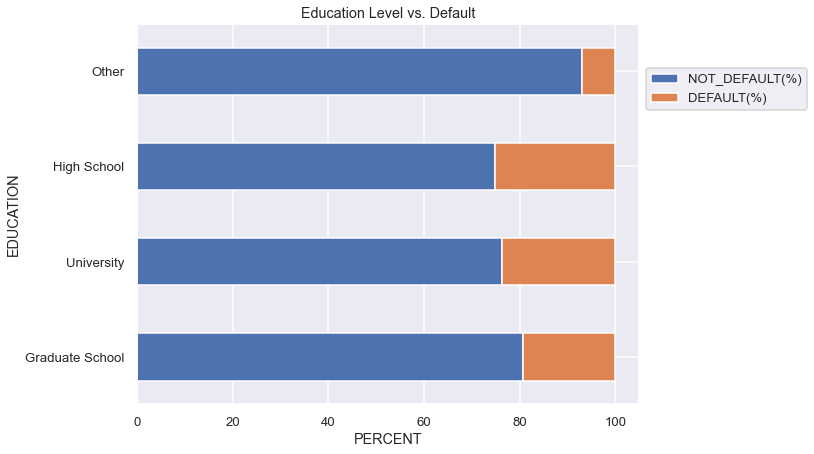

In [24]:
#using Stacked chart to visualize
sns.set_context("talk", font_scale=0.8)
ax = Percentage_edu.plot(x='EDUCATION', kind='barh', stacked=True, title='Education Level vs. Default')
ax.set_xlabel('PERCENT')
ax.get_legend().set_bbox_to_anchor((1, 0.9))
plt.show()


Kết luận (Education Level vs. Default)
Mặc dù số lượng Defalult của High School thấp hơn Graduate School và University. 
Nhưng phần trăm Default của High School chiếm phần lớn, cao hơn Default của Graduate School và University.

# Explore Marriage vs. Default 

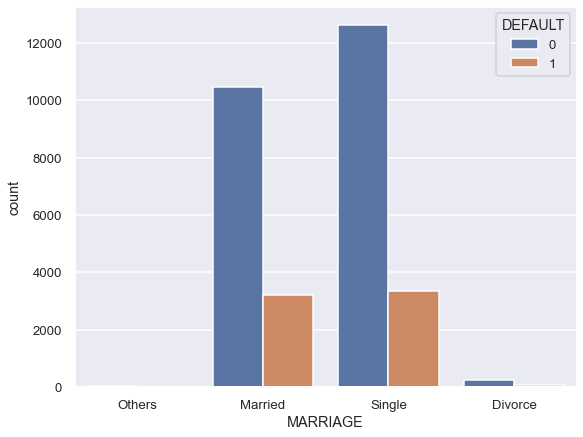

In [25]:
sns.set_context("talk", font_scale=0.8)
marri = sns.countplot(x="MARRIAGE", hue='DEFAULT', data=credits )
marri.set_xticklabels(['Others','Married','Single','Divorce'])
plt.show()

In [26]:
#Show Marriage level and Default Count in table
default_no = credits.groupby(credits['MARRIAGE'][credits['DEFAULT'] == 0]).size().reset_index(name='NOT_DEFAULT')
default_yes = credits.groupby(credits['MARRIAGE'][credits['DEFAULT'] == 1]).size().reset_index(name='DEFAULT')
total = credits.groupby('MARRIAGE').size().reset_index(name='TOTAL')

marriage_Table = default_no.join(default_yes['DEFAULT']).join(total['TOTAL'])
marriage_Table['MARRIAGE'] = ['Married','Single','Divorce','Other']
marriage_Table

,MARRIAGE,NOT_DEFAULT,DEFAULT,TOTAL
0,Married,49,5,54
1,Single,10453,3206,13659
2,Divorce,12623,3341,15964
3,Other,239,84,323


In [27]:
#Percentage
marriage_Table['NOT_DEFAULT'] = round((default_no['NOT_DEFAULT']/total['TOTAL'])*100,2)
marriage_Table['DEFAULT'] = round((default_yes['DEFAULT']/total['TOTAL'])*100,2)

Percentage_marri = marriage_Table.iloc[:,0:3]
Percentage_marri = Percentage_marri.rename(columns={'NOT_DEFAULT': 'NOT_DEFAULT(%)', 'DEFAULT': 'DEFAULT(%)'})
Percentage_marri

,MARRIAGE,NOT_DEFAULT(%),DEFAULT(%)
0,Married,90.74,9.26
1,Single,76.53,23.47
2,Divorce,79.07,20.93
3,Other,73.99,26.01


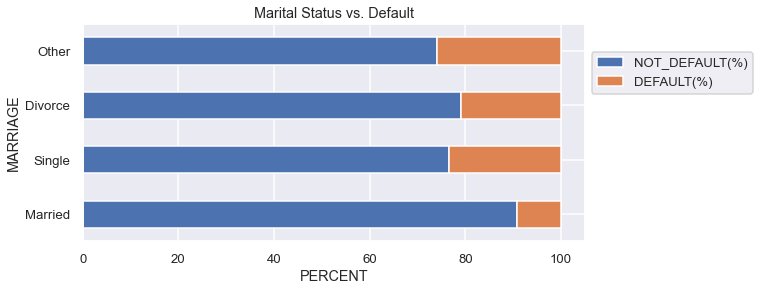

In [28]:
#using Stacked chart to visualize
sns.set(rc={'figure.figsize':(9,4)})
sns.set_context("talk", font_scale=0.8)
ax = Percentage_marri.plot(x='MARRIAGE', kind='barh', stacked=True, title='Marital Status vs. Default')
ax.set_xlabel('PERCENT')
ax.get_legend().set_bbox_to_anchor((1, 0.9))
plt.show()



Kết luận (Marital Status vs. Default)
Mặc dù số lượng Default của Divorce thấp hơn Single & Married
Nhưng phần trăm Default của Divorce chiếm cao hơn Default của Married.




# Explore Credit Behaviour

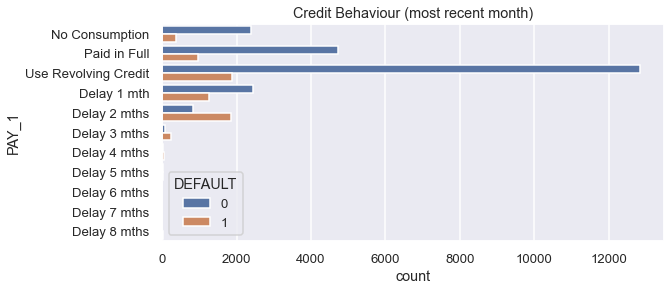

In [29]:
sns.set_context("talk", font_scale=0.8)
pay1 = sns.countplot(y="PAY_1", hue='DEFAULT', data=credits)
pay1.set_yticklabels(['No Consumption','Paid in Full','Use Revolving Credit','Delay 1 mth','Delay 2 mths'
                     ,'Delay 3 mths','Delay 4 mths','Delay 5 mths','Delay 6 mths','Delay 7 mths','Delay 8 mths'])
pay1.set_title('Credit Behaviour (most recent month)')
plt.show()

In [30]:
default_no = credits.groupby(credits['PAY_1'][credits['DEFAULT'] == 0]).size().reset_index(name='NOT_DEFAULT')
default_yes = credits.groupby(credits['PAY_1'][credits['DEFAULT'] == 1]).size().reset_index(name='DEFAULT')
total = credits.groupby('PAY_1').size().reset_index(name='TOTAL')

pay1_Table = default_no.join(default_yes['DEFAULT']).join(total['TOTAL'])
pay1_Table['PAY_1'] = ['No Consumption','Paid in Full','Use Revolving Credit','Delay 1 mth','Delay 2 mths'
                     ,'Delay 3 mths','Delay 4 mths','Delay 5 mths','Delay 6 mths','Delay 7 mths','Delay 8 mths']
pay1_Table

,PAY_1,NOT_DEFAULT,DEFAULT,TOTAL
0,No Consumption,2394,365,2759
1,Paid in Full,4732,954,5686
2,Use Revolving Credit,12849,1888,14737
3,Delay 1 mth,2436,1252,3688
4,Delay 2 mths,823,1844,2667
5,Delay 3 mths,78,244,322
6,Delay 4 mths,24,52,76
7,Delay 5 mths,13,13,26
8,Delay 6 mths,5,6,11
9,Delay 7 mths,2,7,9


In [31]:
pay1_Table['NOT_DEFAULT'] = round((default_no['NOT_DEFAULT']/total['TOTAL'])*100,2)
pay1_Table['DEFAULT'] = round((default_yes['DEFAULT']/total['TOTAL'])*100,2)
pay1_percent = pay1_Table.iloc[:,0:3]
pay1_Percent = pay1_percent.rename(columns={'NOT_DEFAULT': 'NOT_DEFAULT(%)', 'DEFAULT': 'DEFAULT(%)'})
pay1_Percent

,PAY_1,NOT_DEFAULT(%),DEFAULT(%)
0,No Consumption,86.77,13.23
1,Paid in Full,83.22,16.78
2,Use Revolving Credit,87.19,12.81
3,Delay 1 mth,66.05,33.95
4,Delay 2 mths,30.86,69.14
5,Delay 3 mths,24.22,75.78
6,Delay 4 mths,31.58,68.42
7,Delay 5 mths,50.00,50.00
8,Delay 6 mths,45.45,54.55
9,Delay 7 mths,22.22,77.78


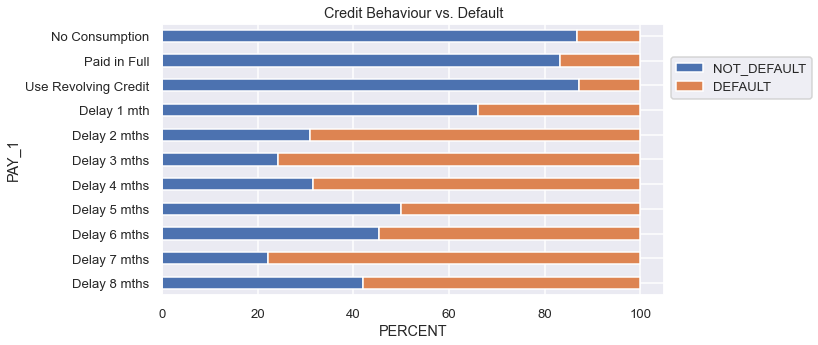

In [32]:
sns.set(rc={'figure.figsize':(9,5)})
sns.set_context("talk", font_scale=0.8)
ax = pay1_percent.sort_index(ascending=False).plot(x='PAY_1', kind='barh', stacked=True, title='Credit Behaviour vs. Default')
ax.set_xlabel('PERCENT')
ax.get_legend().set_bbox_to_anchor((1, 0.9))
plt.show()


Kết luận
Những người sữ dụng Revolving Credit (chỉ trả tối thiểu) và những người bị trì hoãn trong 2 tháng thì có số lượng Default cao nhất. 
Khi thanh toán bị trì hoãn hơn 2 tháng, các cơ hội của Default cao hơn 50%. 


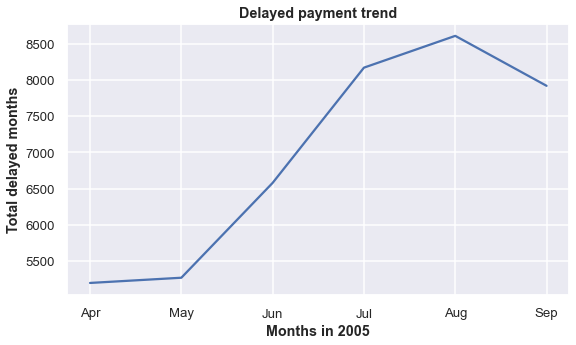

In [33]:
# Subset a dataframe with the records that have default

has_default = credits[credits['HAS_DEF']== 1]
default_trend = has_default[['PAY_6','PAY_5','PAY_4','PAY_3','PAY_2','PAY_1']].sum(axis=0)

# Draw a line chart to show the trend. The lower the number, the shorter delayed payment
fig,ax = plt.subplots()
ax.plot(default_trend)
plt.xticks(['PAY_6','PAY_5','PAY_4','PAY_3','PAY_2','PAY_1'],['Apr','May','Jun','Jul','Aug','Sep'])

plt.xlabel('Months in 2005',fontweight='bold')
plt.ylabel('Total delayed months',fontweight='bold')
plt.title('Delayed payment trend',fontweight='bold')

plt.show()

Có một bước nhảy lớn từ tháng 5,2005 của PAY_5 đến tháng 7,2005 của PAY_3 khi thanh toán chậm tăng đáng kể, sau đó đạt đỉnh ở tháng 8,2005 của PAY_2, vài khoản bắt đầu tốt hơn ở tháng 9,2005 của PAY_1


### Explore Age vs. Default

In [34]:
credits['AGE'].describe()

count    30000.000000
mean        35.485500
std          9.217904
min         21.000000
25%         28.000000
50%         34.000000
75%         41.000000
max         79.000000
Name: AGE, dtype: float64

In [35]:
"""
Theo thống kê thấy thấy rằng:
Khách hàng trẻ nhất là 21 tuổi và lớn nhất là 79 tuổi.
Hầu hết các khách hàng nằm ở độ tuổi từ 26 đến 35.
Và một số nhóm tuổi cụ thể có số lượng người cao hơn.
"""

'\nTheo thống kê thấy thấy rằng:\nKhách hàng trẻ nhất là 21 tuổi và lớn nhất là 79 tuổi.\nHầu hết các khách hàng nằm ở độ tuổi từ 26 đến 35.\nVà một số nhóm tuổi cụ thể có số lượng người cao hơn.\n'

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


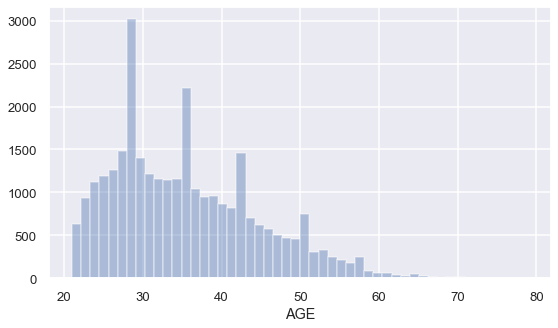

In [36]:
sns.distplot(credits['AGE'], norm_hist=False, kde=False);

In [37]:
#Compare All Client vs. Defaulted Client

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


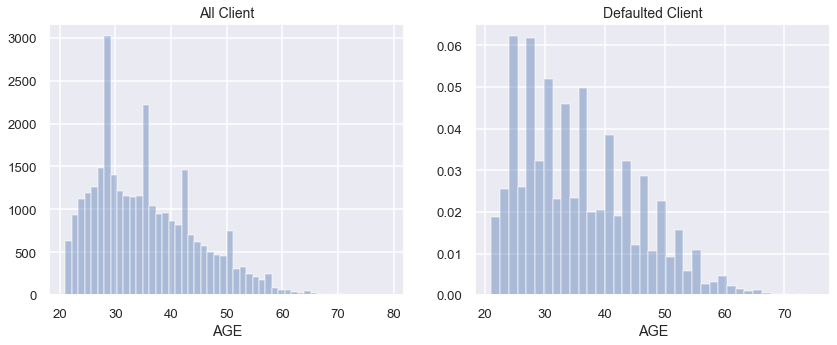

In [38]:
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(14,5))
ax1.set_title('All Client', fontsize=14)
ax2.set_title('Defaulted Client', fontsize=14)
sns.distplot(credits['AGE'], norm_hist=False, kde=False, ax=ax1);
sns.distplot(credits['AGE'][credits['DEFAULT'] == 1], norm_hist=True, kde=False, ax=ax2);

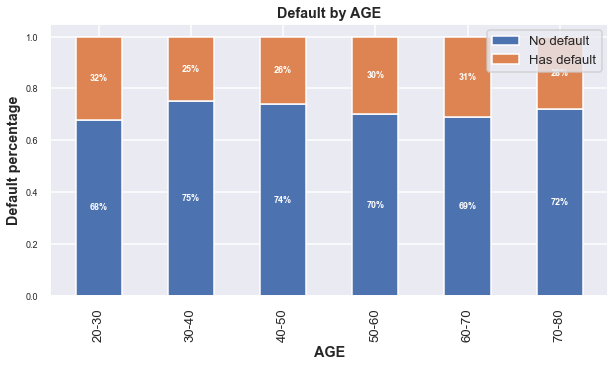

In [39]:
# Segment the 'AGE' column to 6 groups

bins= [21,30,40,50,60,70,80]
labels = ['20-30','30-40','40-50','50-60','60-70','70-80']
credits['AGE'] = pd.cut(credits['AGE'],bins=bins, labels=labels,right=False)
# Plot a stacked bar chart to visualize default and non-default by age

create_stacked_bar('AGE')

Với nhóm trên 60 ta có ít dữ liệu. Vì thế phần trăm có thể không tin cậy.
Lấy một cái nhìn cụ thể ở khoảng tuổi từ 26 đến 36 thì ta có tỷ lệ Default thấp hơn so sánh.
Xác suất default tăng cho khách hàng dưới 30 và trên 70 tuổi. 
Khách hàng ở độ tuổi 30-50 có tỷ lệ thanh toán trễ tháp nhất trong khi đó nhóm tuổi 20-30 và 50-70 có tỷ lệ thanh toán trễ cao hơn.
Độ tuổi 30-50 là nguồn lực kiếm tiền chủ lực nhất trong xã hội 
Tuy nhiên tỷ lệ trì hoãn thanh toán lại giảm nhẹ ở khách hàng độ tuổi trên 70 tuổi.

Text(0.5, 1.0, 'Heatmap of Correlation')

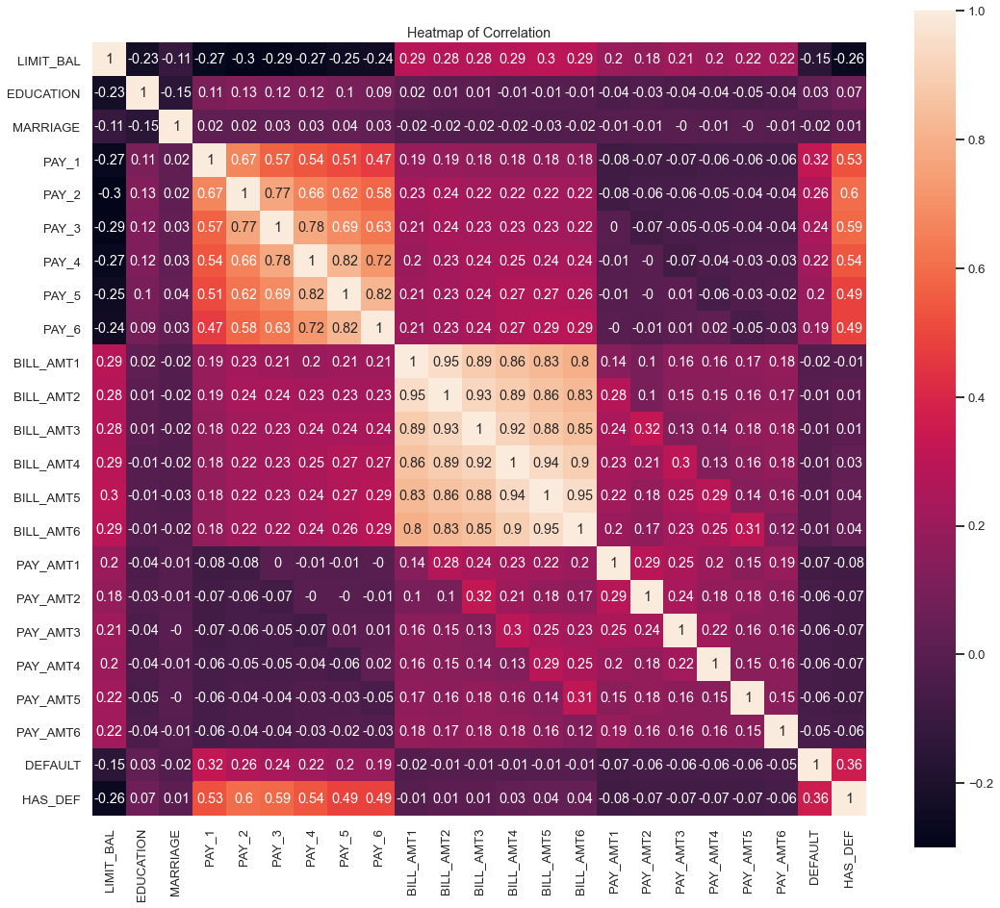

In [40]:
corr = credits.corr().apply(lambda x : round(x,2))
plt.figure(figsize=(18,16))
heatmap=sns.heatmap(corr, vmax=1, square=True,annot=True)
plt.title('Heatmap of Correlation')

Từ đây có thể thấy :
      + Các cột 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6' có mối tương quan cao với nhau,
           hay có thể nói nếu người đó sử dụng tiền thường không quá chênh lệch trong các tháng.
      + Đối với các cột 'PAY_1', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6' có mối tương quan tương đối cao 
           với cột liền kề, hay nói khác hơn là tình trạng trả nợ cuar 2 tháng gần nhau có mối tương quan cao.
      + Bên cạnh đó 'PAY_1', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6' có mối tương quan cao với cột 'DEFAULT',
           nói cách khác thì tình trạng trả nợ có liên quan cao với các đối tượng lỗi.

In [41]:
credits.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_1', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'DEFAULT',
       'HAS_DEF'],
      dtype='object')

In [42]:
credits.LIMIT_BAL.unique()

array([  20000,  120000,   90000,   50000,  500000,  100000,  140000,
        200000,  260000,  630000,   70000,  250000,  320000,  360000,
        180000,  130000,  450000,   60000,  230000,  160000,  280000,
         10000,   40000,  210000,  150000,  380000,  310000,  400000,
         80000,  290000,  340000,  300000,   30000,  240000,  470000,
        480000,  350000,  330000,  110000,  420000,  170000,  370000,
        270000,  220000,  190000,  510000,  460000,  440000,  410000,
        490000,  390000,  580000,  600000,  620000,  610000,  700000,
        670000,  680000,  430000,  550000,  540000, 1000000,  530000,
        710000,  560000,  520000,  750000,  640000,   16000,  570000,
        590000,  660000,  720000,  327680,  740000,  800000,  760000,
        690000,  650000,  780000,  730000], dtype=int64)

In [43]:
def convert(data,col):
    for i in range(len(data)):
        val=data.loc[i,col]
        if val <= 0:
            data.loc[i,col]='pay duly'
        if val==1:
            v=str(val)
            data.loc[i,col]='payment delay '+ v +' month'
        if val > 1:
            v=str(val)
            data.loc[i,col]='payment delay '+ v +' months'
    

In [44]:
# Convert to understand data easier.
cols=['PAY_1','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6']
for col in cols:
    convert(credits,col)

In [45]:
cols=['LIMIT_BAL','EDUCATION','MARRIAGE','AGE', 'PAY_1', 'BILL_AMT1', 'PAY_AMT1','DEFAULT']
month_9=credits[cols].sort_values(by=['AGE']).copy()
month_9.head()

,LIMIT_BAL,EDUCATION,MARRIAGE,AGE,PAY_1,BILL_AMT1,PAY_AMT1,DEFAULT
0,20000,2,1,20-30,payment delay 2 months,3913,0,1
14545,50000,2,2,20-30,pay duly,47385,2472,0
14551,140000,2,2,20-30,payment delay 2 months,107257,0,0
14556,180000,2,2,20-30,pay duly,175773,6059,0
14558,80000,2,1,20-30,pay duly,25424,2000,0


In [46]:
scat = px.scatter(month_9, x = 'AGE', y = 'BILL_AMT1', 
                  color = 'PAY_1',title='September, 2005')
scat.show()

Ta có thể thấy:
     + Có nhiều giao dịch thanh toán hợp lệ.
     + Đối với thanh toán trễ hạn thì đa số là trễ hạn từ 1-3 tháng.
     + Dường như các giao dịch càng trễ hạn thì số tiền trả  càng ít.
     + Những đối tượng trong độ tuỏi từ 20 đến dưới 60 thường trả đúng hạn, và cũng sử dụng tiền tương đối nhiều.
     + Càng về lớn tuổi có xu hướng ít sử dụng thẻ tín dụng hơn.

In [47]:
scat = px.scatter(month_9, x = 'LIMIT_BAL', y = 'BILL_AMT1', color = 'PAY_1',
                  animation_frame='DEFAULT',title='September, 2005')
scat.show()

Từ đây ta có thể thấy:
      + Càng lớn tuổi thì không có xu hướng sử dụng thẻ tín dụng.
      + Người sử dụng thẻ có xu hướng sử dụng không vượt quá số tiền cho phép sử dụng.
      + Đa số khách hàng sử dụng vượt quá số tiền cho phép thường là những khách hàng trả đúng hạn.

In [48]:
scat = px.scatter(month_9, x = 'AGE', y = 'BILL_AMT1', color = 'PAY_1',
                  marginal_x='histogram',marginal_y = 'box',
                  animation_frame='DEFAULT',title='September, 2005')
scat.show()

Từ đây có thể thấy :
      + Đối tượng trên 70 tham gia sử dụng thẻ tín dụng khá ít và đa phần trả đúng hẹn nên 
           có xu hướng không thanh toán vào tháng 10.
      + Có vẻ khách hàng không thanh toán vào tháng tiếp theo nhiều hơn các khách hàng cần trả nợ vào tháng 10.
      + Các khách hàng không thanh toán vào tháng tiếp theo thường trả đúng hạn, và không quá hạn quá lâu(2 tháng). 
           Ngược lại các khác hàng lỗi có xu hướng kéo dài thời gian trả tiền.
      + Các khách hàng cần trả nợ vào tháng tiếp theo có vẻ thường là đối tượng dưới 50 tuổi.